# Multimodal Embeddings

By: Aveontae Frazier

### First... what is an *Embedding?*

**Embeddings** are `numerical representations of data that are learned through model training`. They map data (such as words, images, or other entities) into a continuous vector space where semantically similar entities are represented by vectors that are close together. Unlike arbitrary representations, embeddings are designed to capture meaningful relationships and patterns in the data, making them semantically rich and useful for tasks like similarity search, clustering, and input to machine learning models.

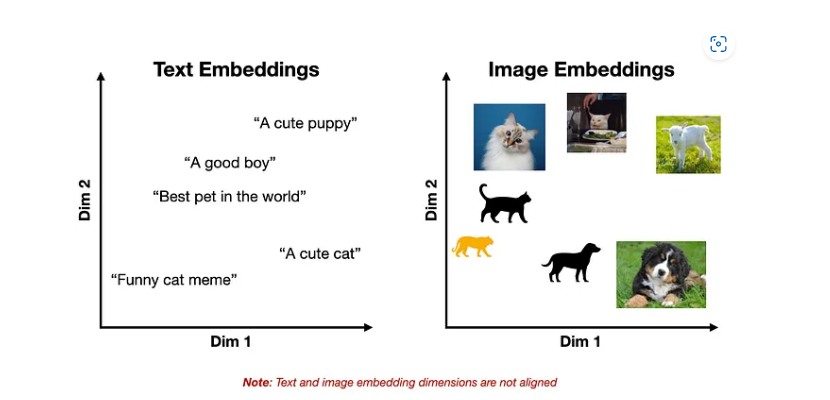

**Multimodal Embeddings** align representations of separate data modalities.

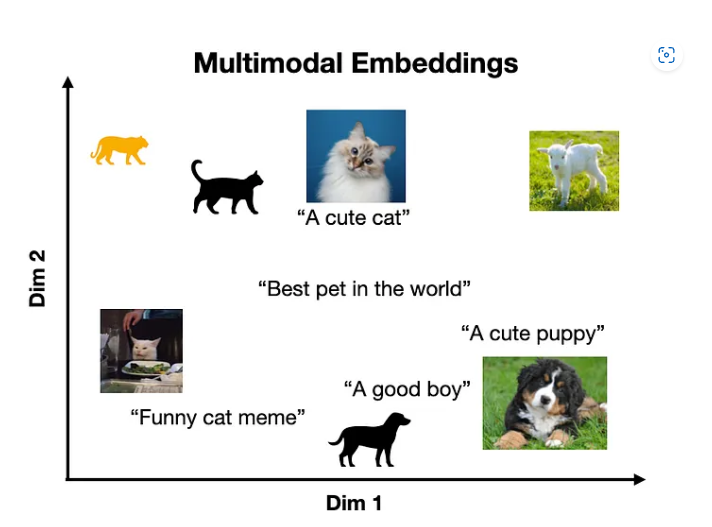

### But How?

One approach is called `Contrastive Learning`. It is a learning methodology which seeks to represent different views of the same information *similarly*. The goal is to *maximize the similarity* between **positive pairs** and *minimize the similarity* between **negative pairs**.

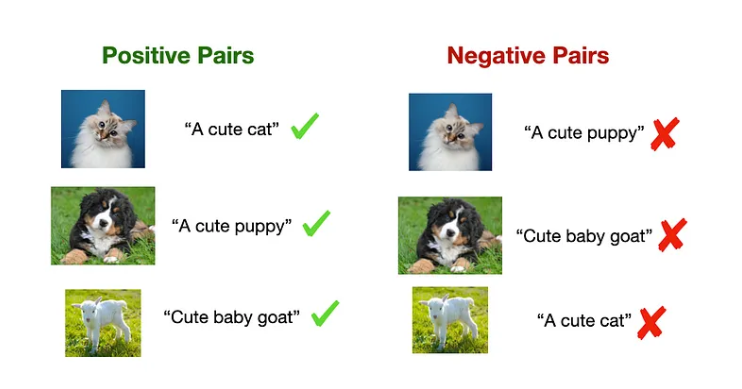

#### The Process...
1. Using an image encoder, generate single numerical representations on the images-called the image embeddings.
2. Concatenate each image into a (*n* x *d*) matrix (where **n** *is the number of images*, and **d** *is the embedding dimension*).
3. Do the same for text, first, generating the text embedding using a text encoder, then concatenating into an (*n* x *d*) matrix.

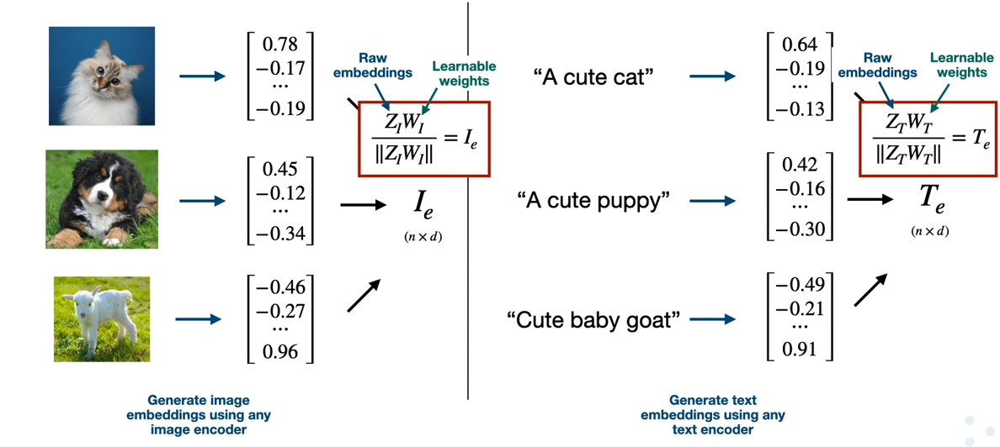

Once both I and T matrices are constructed, the `logits matrix` below can be computed.

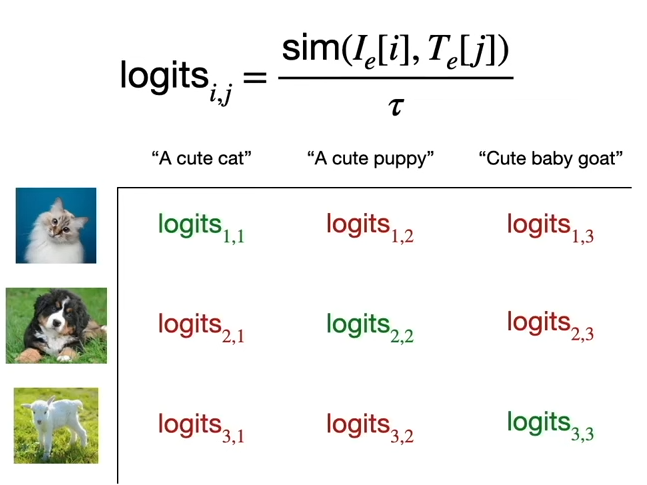

##### So, the goal is to `maximaze the logits/similarity along the diagonal (the positive pairs) and minimize the off diagonal logits/similarity (the negative pairs)`

### Again, how?

One way to maximize similarity along the diagonal while simultaneously minimizing the off diagonal elements is the **`Contrastive Loss Function`**.

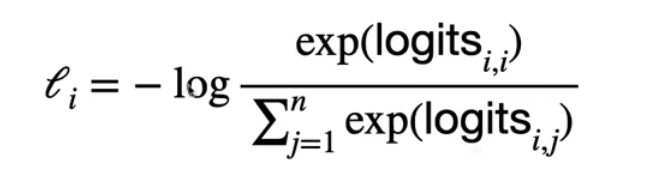

Focusing on images first:

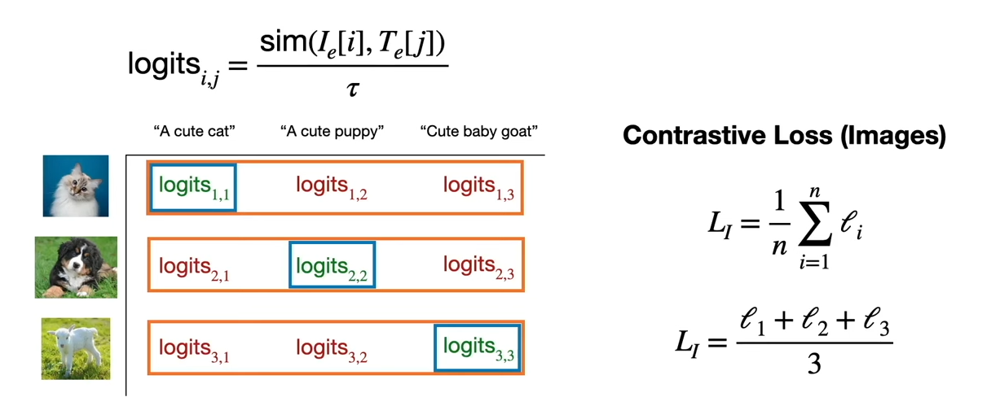

But, the same must be completed for text as well:

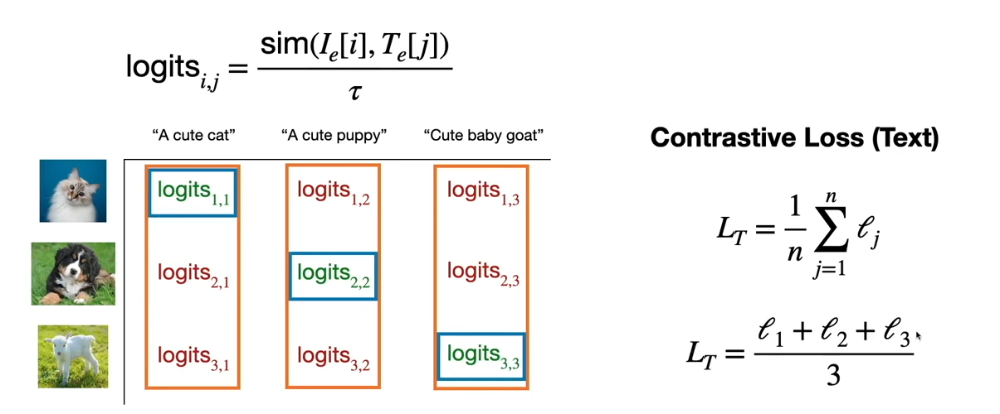

The final loss will account for both image and text:

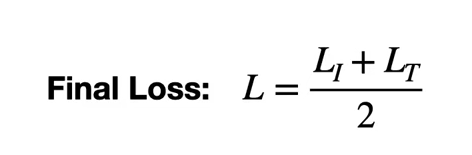

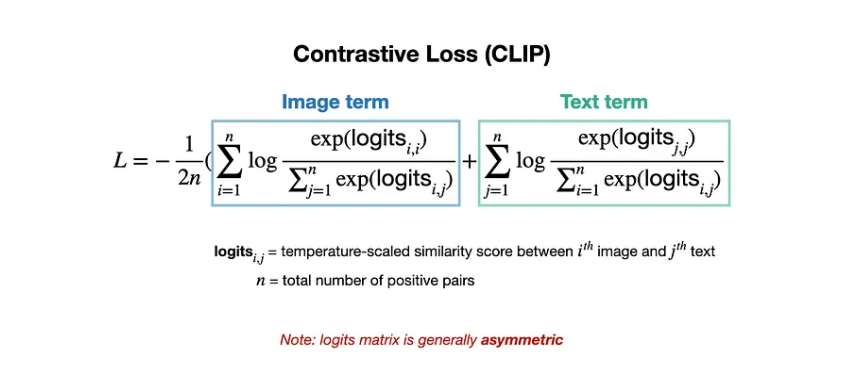

## 0-Shot Image Classification with CLIP
*Reminder: 0-shot image classification is image classification without explicitly training the model to distinguish between classes*

In [42]:
# Import libs
from transformers import CLIPProcessor, CLIPModel
from PIL import Image

### Import Model

In [45]:
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch16") # import model

# Import preprocessor 
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch16") # handles text tokenization and image preprocessing

## Load Generated Cat Image 

In [50]:
image = Image.open("assets/images/cute-cat.png") # cute cat image demonstrate below

# Define Text Classes
text_classes = ["a photo of a cat", "a photo of a dog"]

*I generated this cute cat photo using OpenAI's Dall-E 3 model*

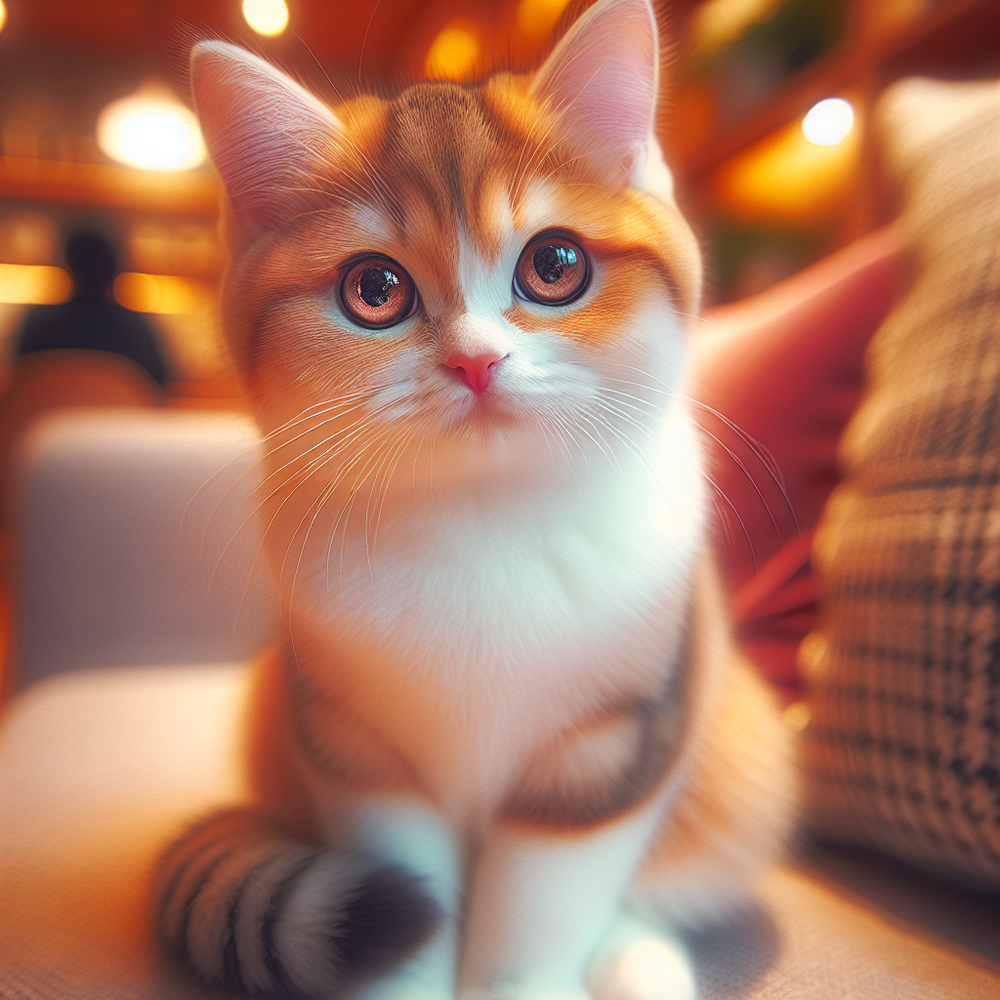

## Pass Image and Text to CLIP

In [59]:
inputs = processor(text=text_classes,
                   images=image, 
                   return_tensors="pt",
                   padding=True
)

# Pass inputs to CLIP
outputs = model(**inputs) # NOTE: "**" unpacks dictionary items

## Convert Image Logits to Probabilities

In [71]:
# Image-text similarity score
logits_per_image = outputs.logits_per_image

Circling back to the earlier math, the code above extracts the logit/similarity values between the image and every text class passed to the model.

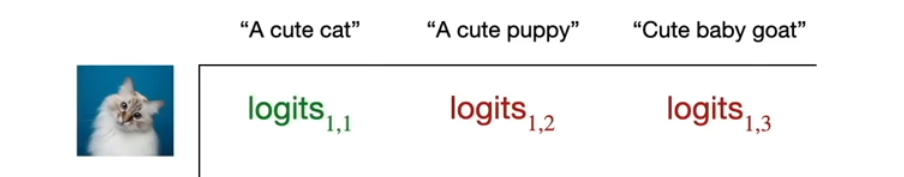

Then, we convert the logits to probabilities via **`Softmax`**.

In [100]:
# Convert similarity scores to prob via softmax
probs = logits_per_image.softmax(dim=1)

# Evaluate Which Class Corresponds to the Max
predicted_class = text_classes[probs.argmax()]

# Print Pred
print(predicted_class,
      "| Probability = ",
     round(float(probs[0][probs.argmax()]),4)
)

a photo of a cat | Probability =  0.9982


### Let's try something a bit harder...

In [111]:
# Custom function to prevent repetition
def class_predictor(image_path, text_classes):
    
    image = Image.open(image_path)
    
    inputs = processor(text=text_classes,
                   images=image, 
                   return_tensors="pt",
                   padding=True)
    
    # Pass inputs to CLIP
    outputs = model(**inputs) 
    
    # Image-text similarity score
    logits_per_image = outputs.logits_per_image
    
    # Convert similarity scores to prob via softmax
    probs = logits_per_image.softmax(dim=1)

    # Evaluate Which Class Corresponds to the Max
    predicted_class = text_classes[probs.argmax()]

    # Print Pred
    return(print(predicted_class,
          "| Probability = ",
         round(float(probs[0][probs.argmax()]),4))
    )

In [118]:
class_predictor("assets/images/cute-cat.png",
               ["a cute cat", "a ugly cat"]) # cute versus ugly

a cute cat | Probability =  0.997


### Meme or not?

In [121]:
class_predictor("assets/images/cute-cat.png",
               ["a cat meme", "not a cat meme"]) # a step more challenging

not a cat meme | Probability =  0.5077


It was able to accurately identified the image is not a meme, but with pretty low confidence. How about with an actual cat meme?

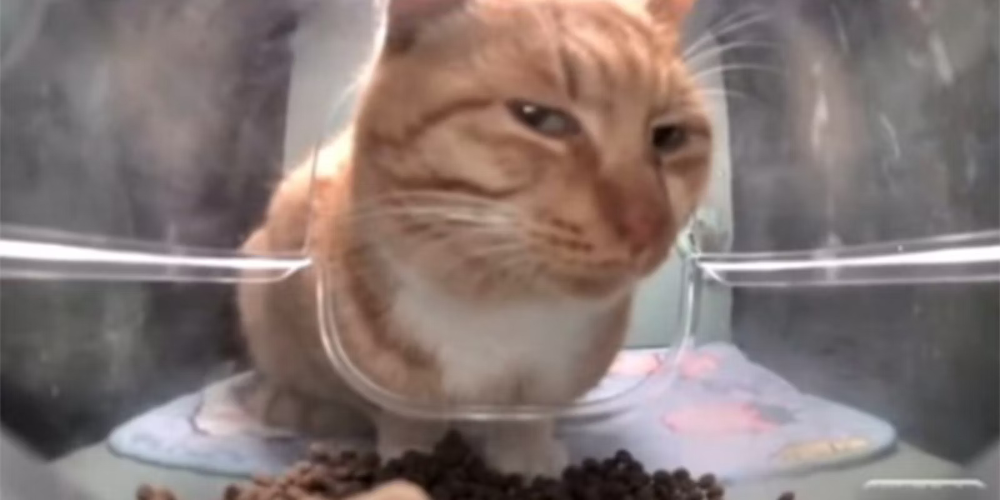

In [133]:
class_predictor("assets/images/side-eye-cat-meme.jpg",
               ["a cat meme", "not a cat meme"]) # actual cat meme

a cat meme | Probability =  0.6013


Nice! Even without structured labels, the model accurately identified the meme. Here is one more famus one:

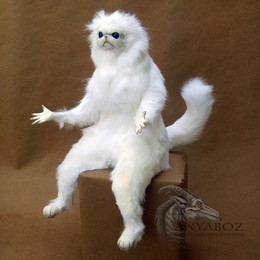

In [135]:
class_predictor("assets/images/cat-meme.jpg",
               ["a cat meme", "not a cat meme"]) # actual cat meme

a cat meme | Probability =  0.8222


## Image Search using CLIP
*This is essentially the inverse of image classification, i.e., instead of starting with an image, we will start with a piece of text (the search query), then match it to a set of images.*

### Load Images to Search Over

In [182]:
# List of Generated Images
image_name_list = ["assets/images/cute-cat.png",
                   "assets/images/cute-dog.png",
                   "assets/images/cute-wolf.png",
                   "assets/images/hippo.png"
]

image_list = [] # Initialize empty list
for image_name in image_name_list:
    image_list.append(Image.open(image_name))

### Define the Search Query

In [185]:
# Query
query = "a cute dog"

# Pass images and query to CLIP
inputs = processor(text=query,
                   images=image_list,
                   return_tensors="pt",
                   padding=True
)

### Compute Loguts, then Convert to Probs

In [188]:
outputs = model(**inputs)

# Extract the Logits
logits_per_text = outputs.logits_per_text # NOTE: the subtle difference "per text" as oppose to "per image" in image classification


# Convert to Probs using Softmax
probs = logits_per_text.softmax(dim=1)

### Calculate Best Match

Match Probability:  0.8307


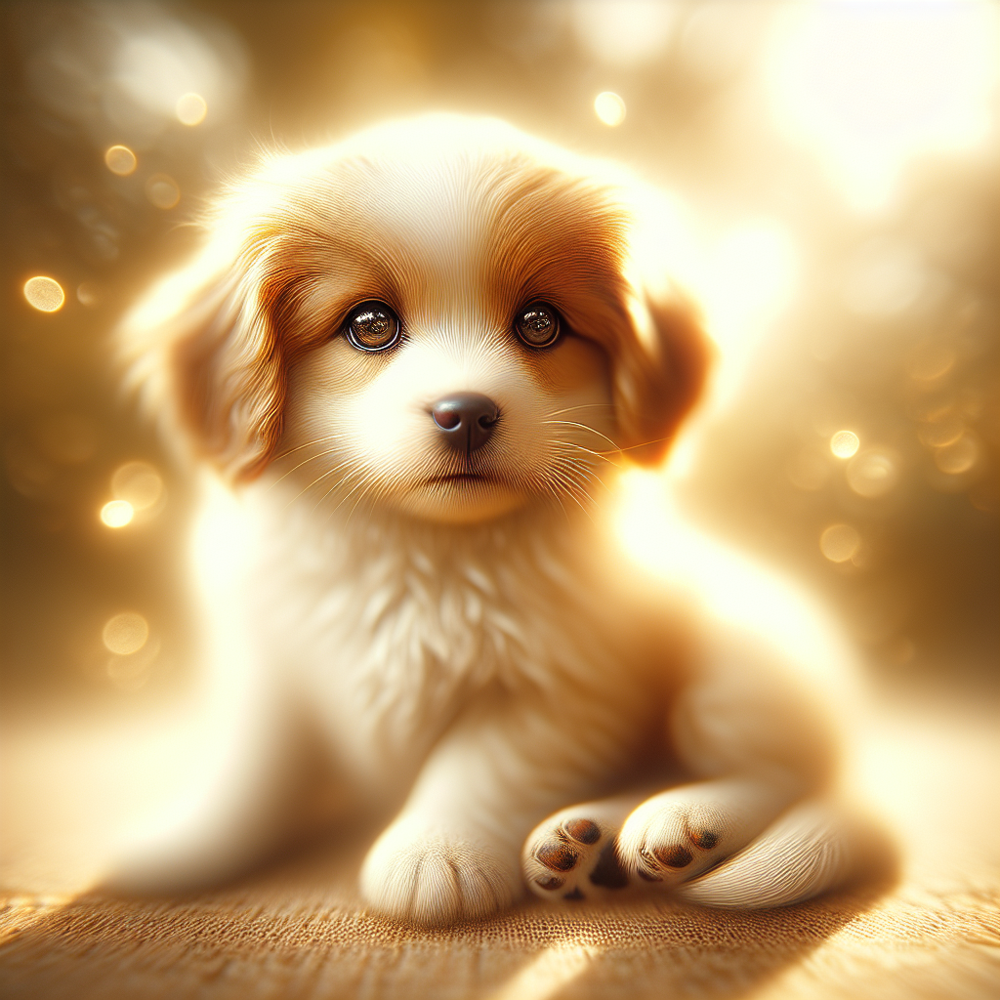

In [191]:
best_match = image_list[probs.argmax()] # best match

# Best Match Probability
prob_match = round(float(probs[0][probs.argmax()]),4)

print("Match Probability: ",
     prob_match)
display(best_match)

### Let's get more naunced...

In [300]:
# Custom function to Prevent Repetition
def search_for_image(query):
    
    # List of Generated Images
    image_name_list = ["assets/images/cute-cat.png",
                       "assets/images/cute-dog.png",
                       "assets/images/cute-wolf.png",
                       "assets/images/hippo.png"
    ]

    image_list = [] # Initialize empty list
    for image_name in image_name_list:
        image_list.append(Image.open(image_name))

    # Pass images and query to CLIP
    inputs = processor(text=query,
                       images=image_list,
                       return_tensors="pt",
                       padding=True
    )
    outputs = model(**inputs)

    # Extract the Logits
    logits_per_text = outputs.logits_per_text
    
    # Convert to Probs using Softmax
    probs = logits_per_text.softmax(dim=1)
    
    # Index of the highest probability
    best_match_idx = probs.argmax().item()

    best_match = image_list[best_match_idx] # best match

    # Best Match Probability
    prob_match = round(float(probs[0][best_match_idx]),4)

    return f"Match Probability: {prob_match}", best_match

Match Probability: 0.9563


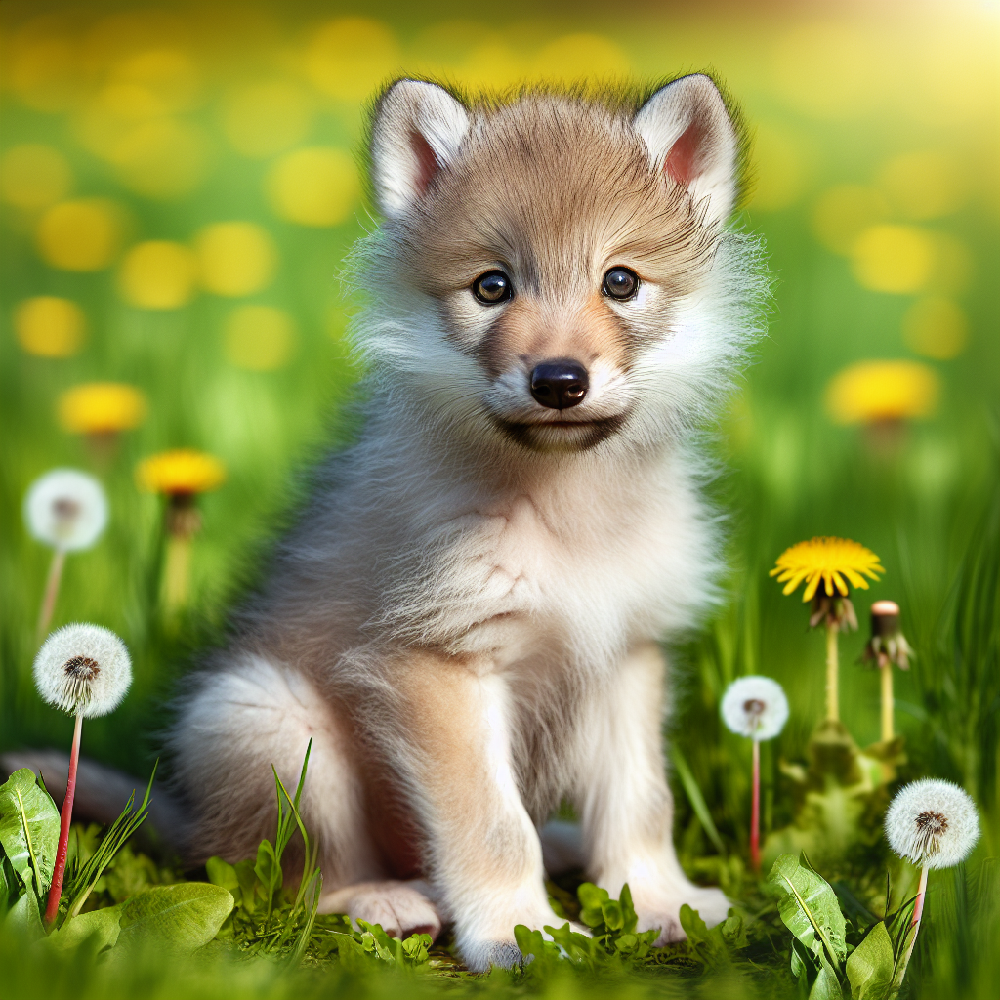

In [310]:
match_probability, best_image = search_for_image("A wild pack animal") # a little more challenging
print(match_probability)
display(best_image)

Match Probability: 0.6065


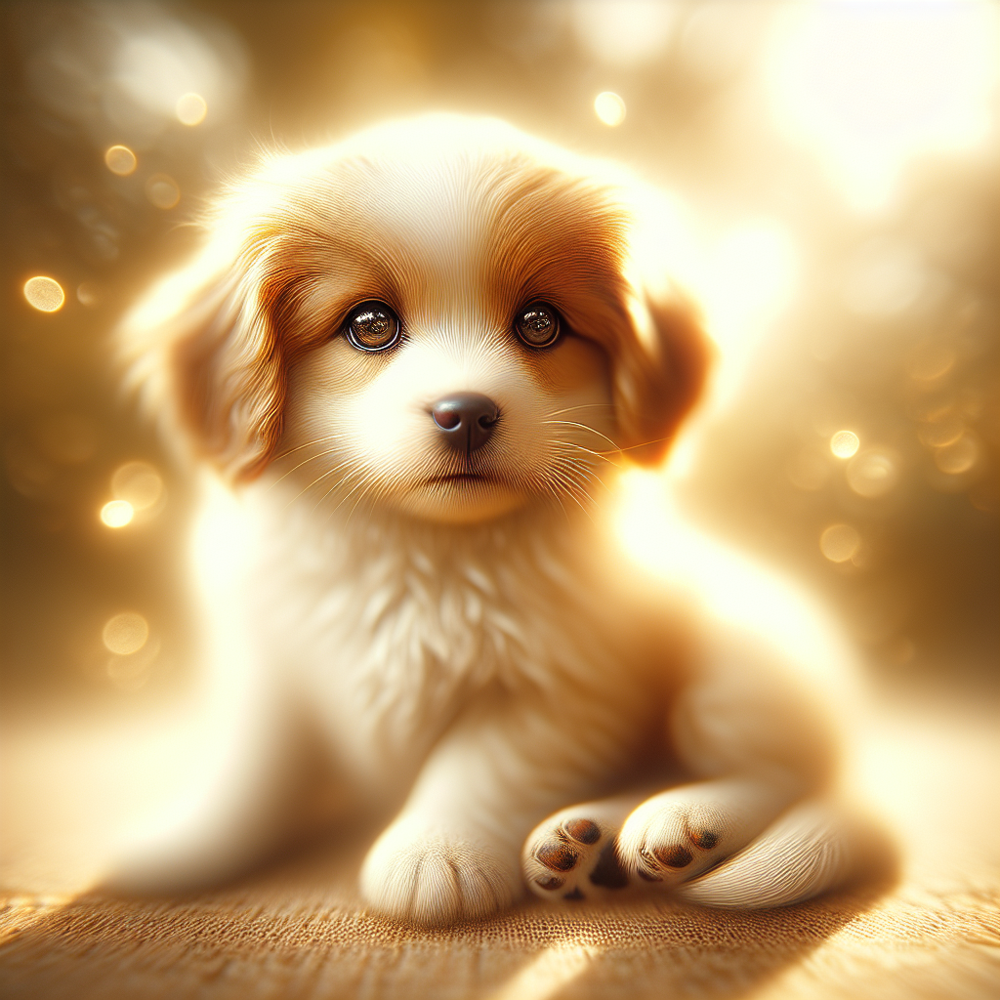

In [314]:
match_probability, best_image = search_for_image("A good boy") # more challenging, typically associated with dogs though
print(match_probability)
display(best_image)

Match Probability: 0.8775


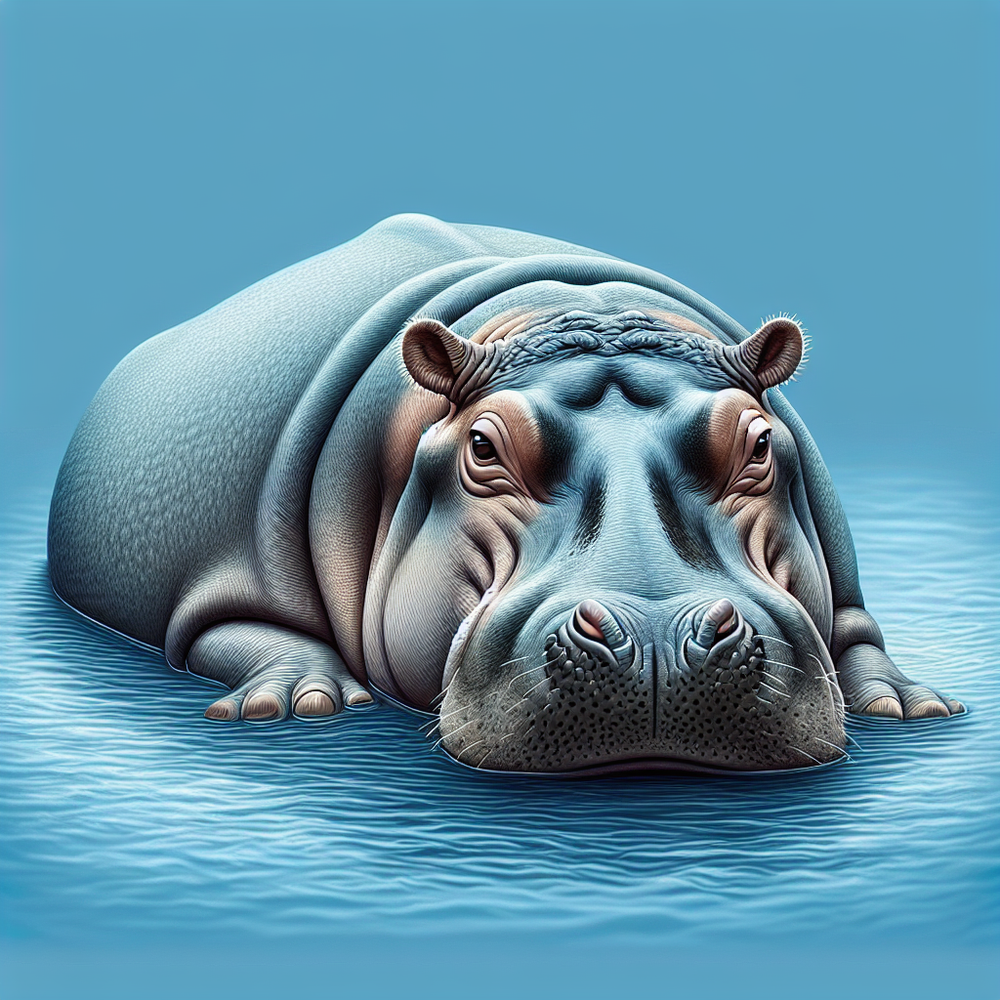

In [316]:
match_probability, best_image = search_for_image("Nile 🌊🛶🌲") # even more challenging
print(match_probability)
display(best_image)

Nice! Even though the Nile is known for many things, it is famously known as the home of the Hippopotamus!

#### What does the model think is the best pet?

Match Probability: 0.5593


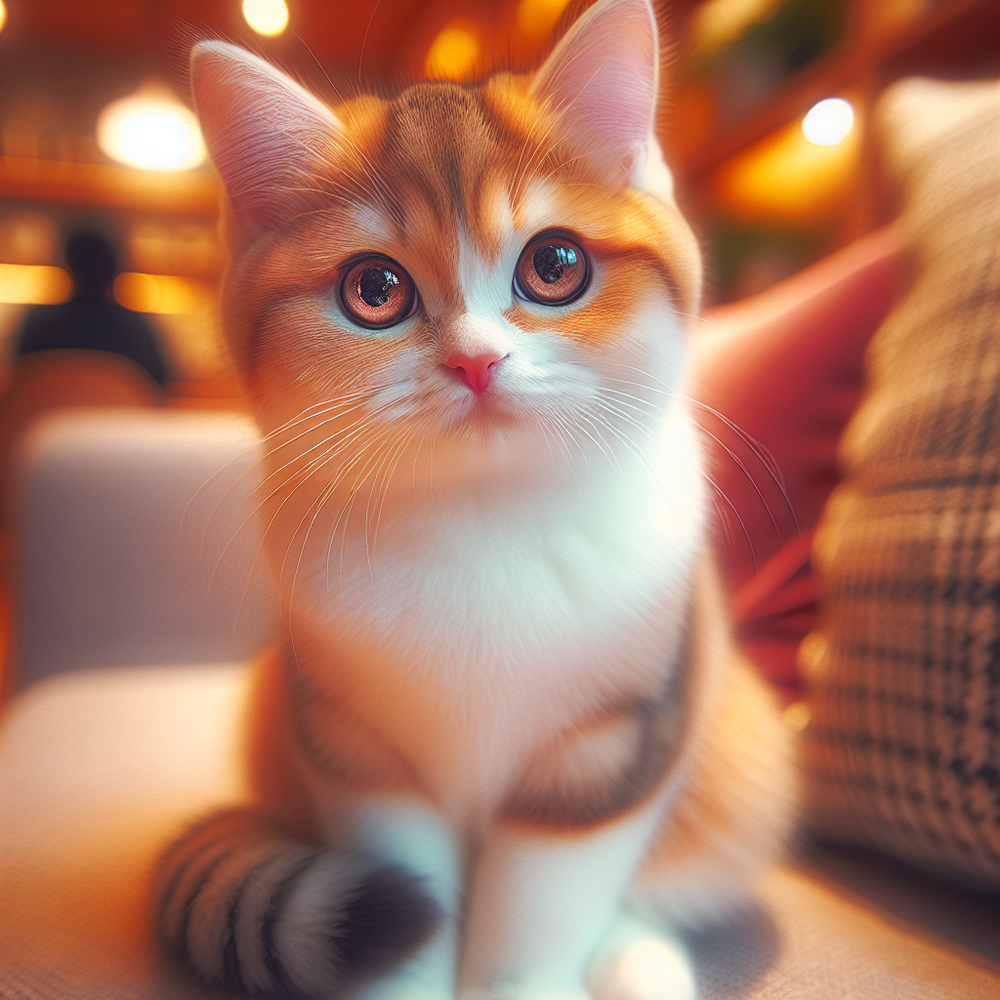

In [318]:
match_probability, best_image = search_for_image("The best pet in the world!")
print(match_probability)
display(best_image)